In [1]:
import json
import string
import wordcloud
import pandas as pd
import numpy as np
import seaborn as sns
from itertools import product
import matplotlib as mpl
import matplotlib.pyplot as plt
from britain_elects_utils import (parties,
                                  read_data,
                                  process_wvi_data,
                                  null_values_plot,
                                  plot_vote_intention)
from polling_report_history import read_historical_polling_report
from IPython.core.display import display, HTML

display(HTML("<style>.container { width:95% !important; }</style>"))

with open("mpl_params.json", "r") as f:
    mpl_params = json.load(f)
mpl.rcParams.update(mpl_params)

%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

/tmp/ipykernel_2066999/845967059.py:16: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
df = pd.read_csv("./britain_elects_all/britain_elects_all.csv", index_col=0)
chars_to_keep = string.ascii_letters + string.digits + "%- "
df["full_text"] = df["full_text"].str.replace("\n", " ")
df["full_text"] = df["full_text"].apply(lambda x: ''.join([char for char in x if char in chars_to_keep]).lower())

In [3]:
wcloud = wordcloud.WordCloud(background_color='white', width=1500, height=800).generate(' '.join(df["full_text"]))

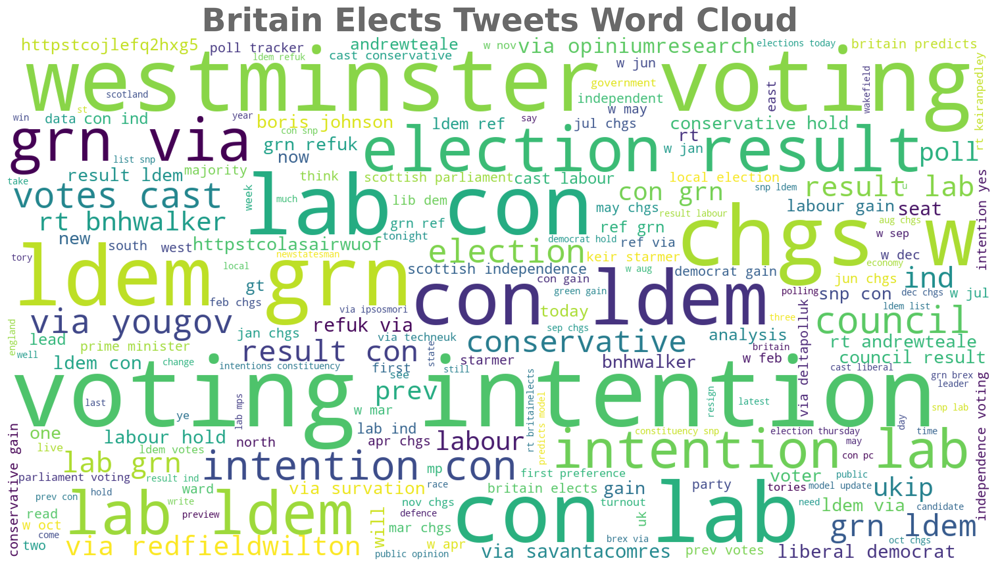

In [4]:
plt.figure(figsize=(15, 8), facecolor=None) 
plt.imshow(wcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.title("Britain Elects Tweets Word Cloud", fontweight="bold", fontsize=35);

In [5]:
df = read_data("britain_elects_wvi_data")
df = process_wvi_data(df)

In [6]:
df.tail()

,created_at,source,start,end,change_info,GRN,GRN_change,LAB,LAB_change,LDEM,...,CON_change,BREX,BREX_change,REFUK,REFUK_change,UKIP,UKIP_change,OTH,OTH_change,collection_source
date,,,,,,,,,,,,,,,,,,,,,
2023-03-29,2023-03-31 14:40:04,Omnisis,2023-03-28,2023-03-29,NaN,4.0,-1.0,50.0,6.0,9.0,...,-2.0,NaN,NaN,6.0,0.0,NaN,NaN,NaN,NaN,britainelects
2023-04-02,2023-04-03 16:01:19,RedfieldWilton,2023-04-02,2023-04-02,NaN,4.0,0.0,45.0,-1.0,12.0,...,1.0,NaN,NaN,5.0,-3.0,NaN,NaN,NaN,NaN,britainelects
2023-04-03,2023-04-03 16:51:35,DeltapollUK,2023-03-31,2023-04-03,NaN,4.0,0.0,48.0,3.0,9.0,...,-3.0,NaN,NaN,5.0,1.0,NaN,NaN,NaN,NaN,britainelects
2023-03-29,2023-04-04 10:37:15,IpsosUK,2023-03-22,2023-03-29,NaN,6.0,1.0,49.0,-2.0,11.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,britainelects
2023-04-06,2023-04-06 18:31:18,Omnisis,2023-04-06,2023-04-06,NaN,5.0,1.0,46.0,-4.0,10.0,...,-1.0,NaN,NaN,7.0,1.0,NaN,NaN,NaN,NaN,britainelects


In [7]:
histo = read_historical_polling_report()
histo.head()

,source,end,CON,LAB,LDEM,UKIP,GRN,collection_source
date,,,,,,,,
2019-12-11,DeltapollUK,2019-12-11,45,35,10,NaN,3.0,uk_prh
2019-12-11,KantarPublic,2019-12-11,44,32,13,NaN,3.0,uk_prh
2019-12-11,BMGResearch,2019-12-11,41,32,14,NaN,3.0,uk_prh
2019-12-11,OpiniumResearch,2019-12-11,45,33,12,NaN,2.0,uk_prh
2019-12-11,Panelbase,2019-12-11,43,34,11,NaN,3.0,uk_prh


In [8]:
df = pd.concat([histo, df]).sort_index()

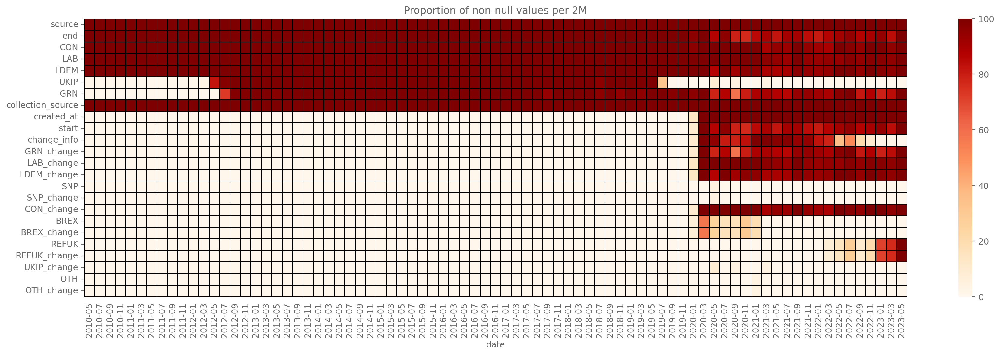

In [9]:
figsize = (22, 6)
freq = "2M"
fig, ax = plt.subplots(1, 1, figsize=figsize)
null_counts = df.resample(freq).agg({col: lambda s: 100*(s.notnull().sum()/len(s)) for col in df.columns})
sns.heatmap(null_counts.to_period(freq).T, cmap="OrRd", linewidths=1, linecolor="black", ax=ax)
ax.set_title(f"Proportion of non-null values per {freq}");

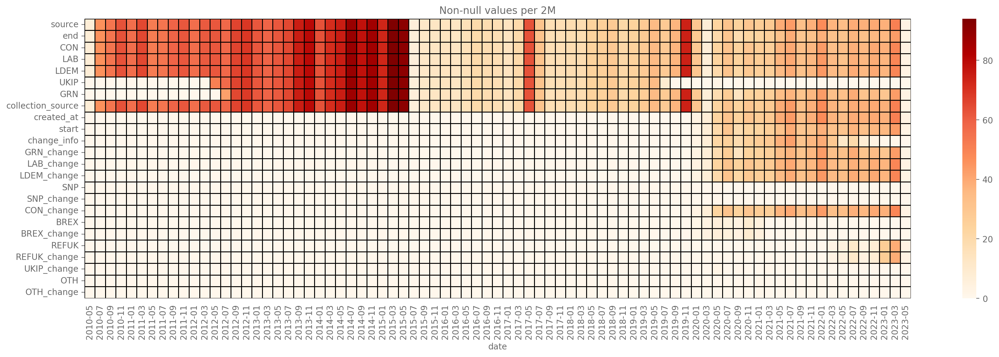

In [10]:
figsize = (22, 6)
freq = "2M"
fig, ax = plt.subplots(1, 1, figsize=figsize)
null_counts = df.resample(freq).agg({col: lambda s: s.notnull().sum() for col in df.columns})
sns.heatmap(null_counts.to_period(freq).T, cmap="OrRd", linewidths=1, linecolor="black", ax=ax)
ax.set_title(f"Non-null values per {freq}");

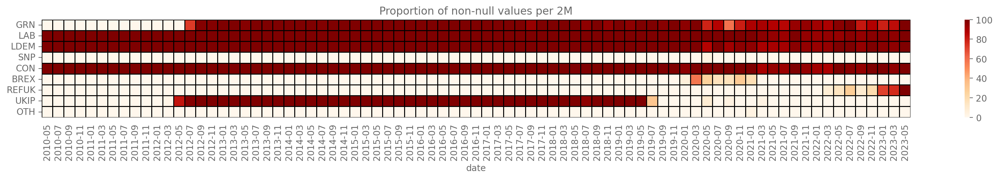

In [11]:
figsize = (22, 2)
freq = "2M"
fig, ax = plt.subplots(1, 1, figsize=figsize)
null_counts = df.resample(freq).agg({col: lambda s: 100*(s.notnull().sum()/len(s)) for col in parties})
sns.heatmap(null_counts.to_period(freq).T, cmap="OrRd", linewidths=1, linecolor="black", ax=ax)
ax.set_title(f"Proportion of non-null values per {freq}")
ax.set_yticklabels(ax.get_yticklabels(), rotation=0);

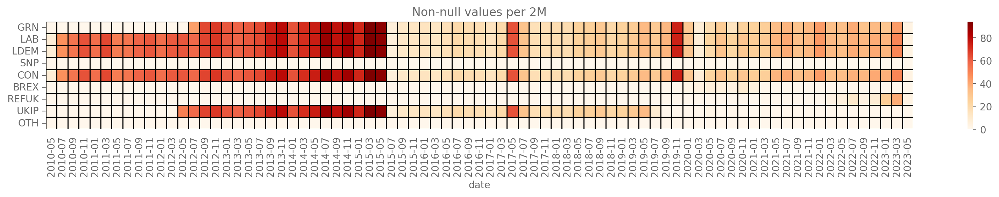

In [12]:
figsize = (20, 2)
freq = "2M"
fig, ax = plt.subplots(1, 1, figsize=figsize)
null_counts = df.resample(freq).agg({col: lambda s: s.notnull().sum() for col in parties})
sns.heatmap(null_counts.to_period(freq).T, cmap="OrRd", linewidths=1, linecolor="black", ax=ax)
ax.set_title(f"Non-null values per {freq}")
ax.set_yticklabels(ax.get_yticklabels(), rotation=0);

In [13]:
plt.style.use("fivethirtyeight")

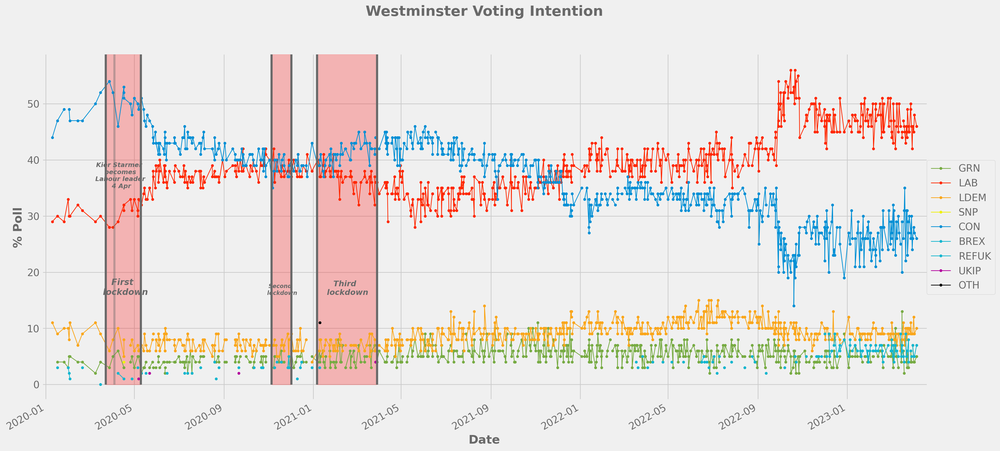

In [14]:
plot_vote_intention(df[df["collection_source"] == "britainelects"], add_lockdown_context=True);

/home/ubuntu/repo/polling-data-analysis/britain_elects_utils.py:221: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  .mean()[list(parties)]


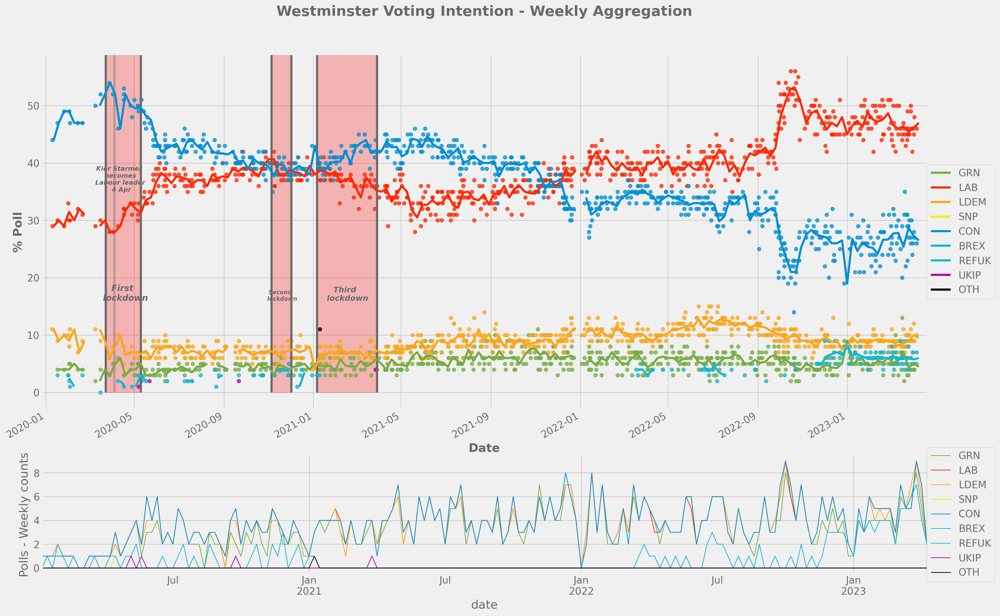

In [15]:
plot_vote_intention(df[df["collection_source"] == "britainelects"], agg="W", add_lockdown_context=True, markersize=5);

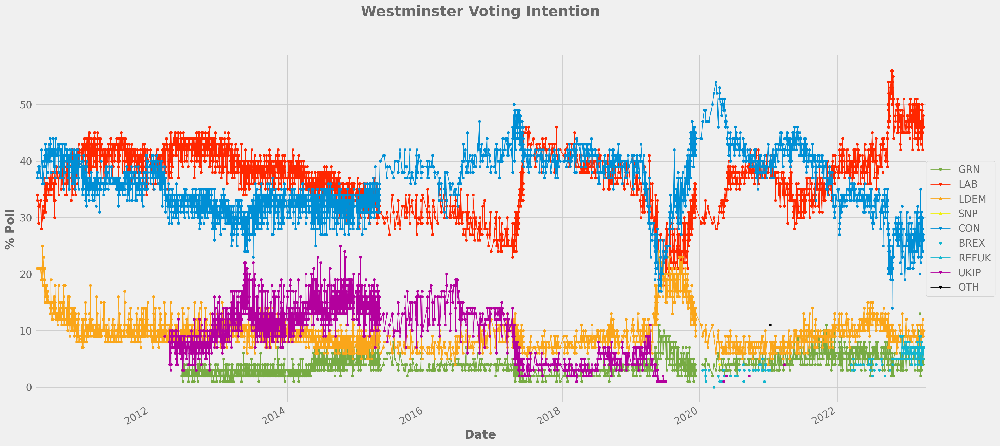

In [16]:
plot_vote_intention(df);

/home/ubuntu/repo/polling-data-analysis/britain_elects_utils.py:221: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  .mean()[list(parties)]


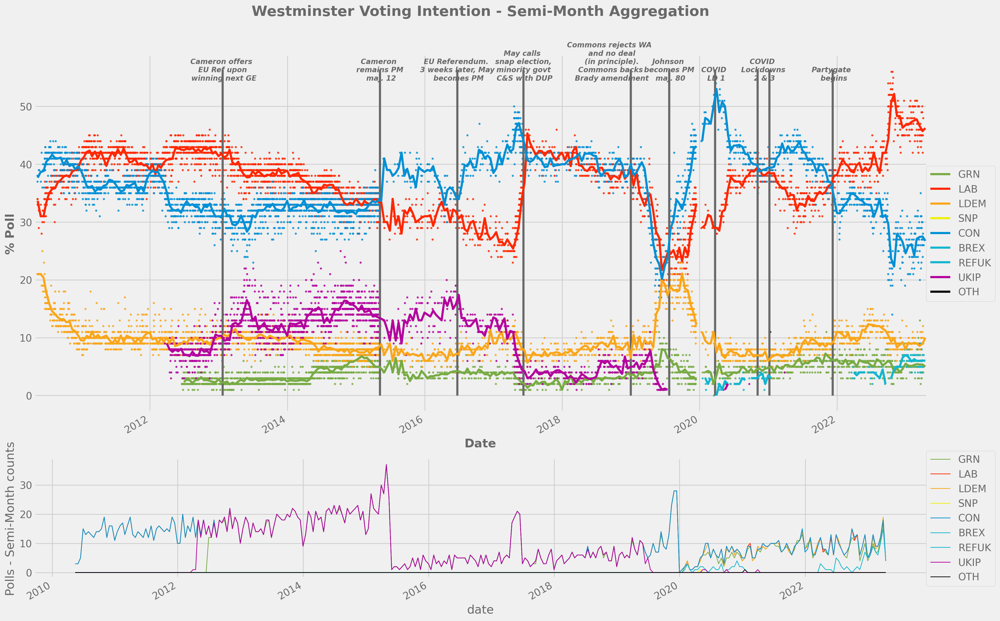

In [17]:
plot_vote_intention(df, agg='SM', add_lifetime_context=True);

/home/ubuntu/repo/polling-data-analysis/britain_elects_utils.py:221: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  .mean()[list(parties)]


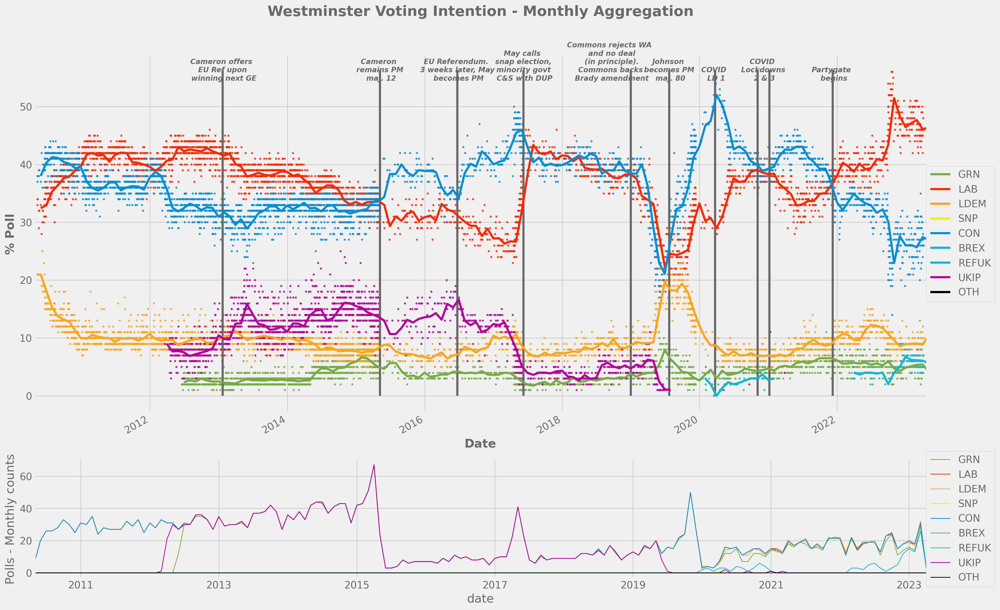

In [18]:
plot_vote_intention(df, agg='M', add_lifetime_context=True);

In [19]:
df[list(parties)].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3345 entries, 2010-05-13 00:00:00 to 2023-04-06 00:00:00
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   GRN     2539 non-null   float64
 1   LAB     3323 non-null   float64
 2   LDEM    3314 non-null   float64
 3   SNP     1 non-null      float64
 4   CON     3321 non-null   float64
 5   BREX    35 non-null     float64
 6   REFUK   100 non-null    float64
 7   UKIP    1891 non-null   float64
 8   OTH     1 non-null      float64
dtypes: float64(9)
memory usage: 261.3 KB


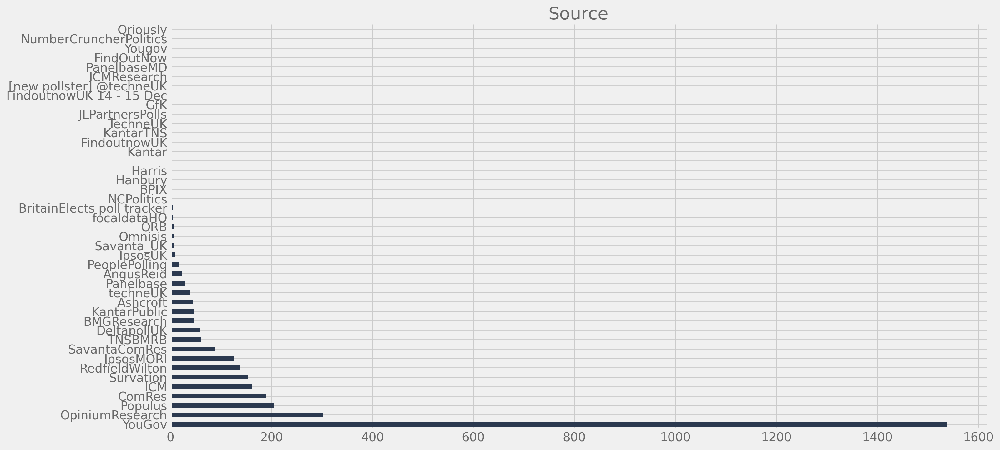

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
df["source"].value_counts().plot(kind='barh', ax=ax, color="#2b394f")
ax.set_title("Source");

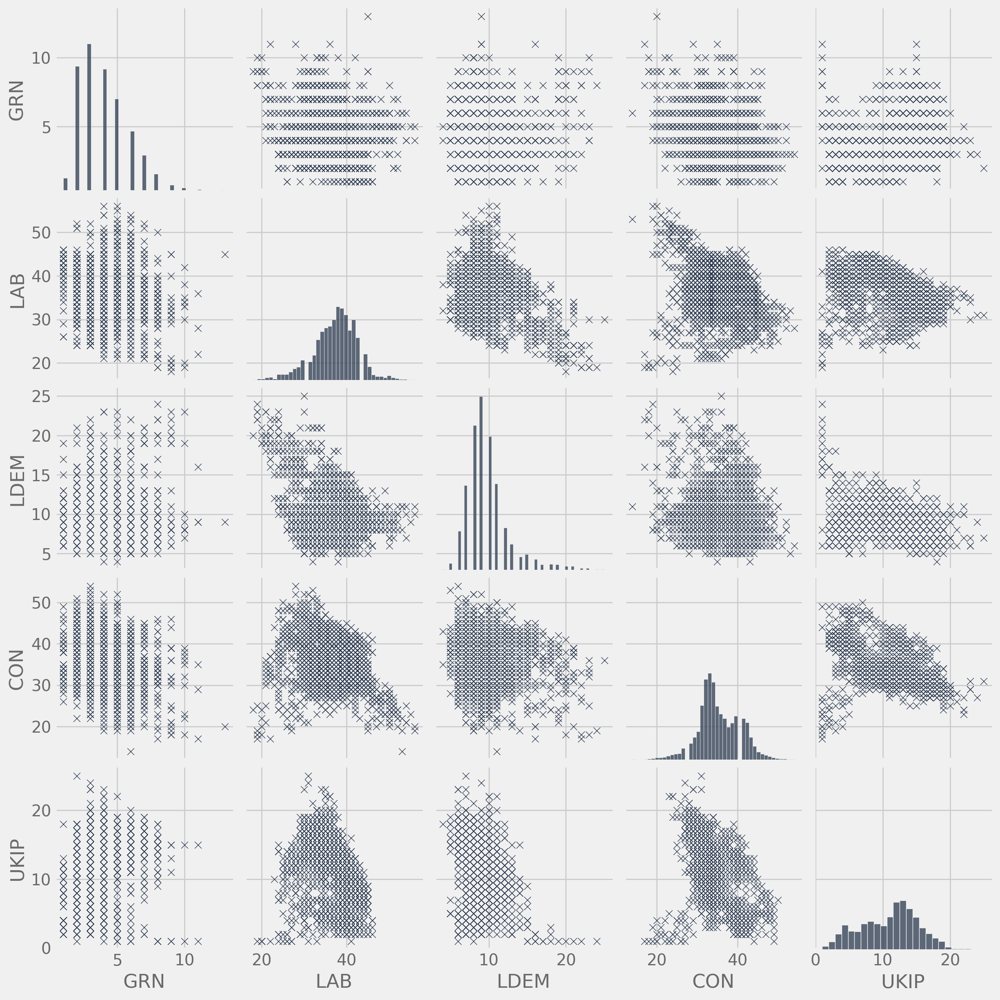

In [21]:
sns.pairplot(df[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].reset_index(drop=True), markers="x",
             diag_kws={"color": "#2b394f"},
             plot_kws={"color": "#2b394f"});

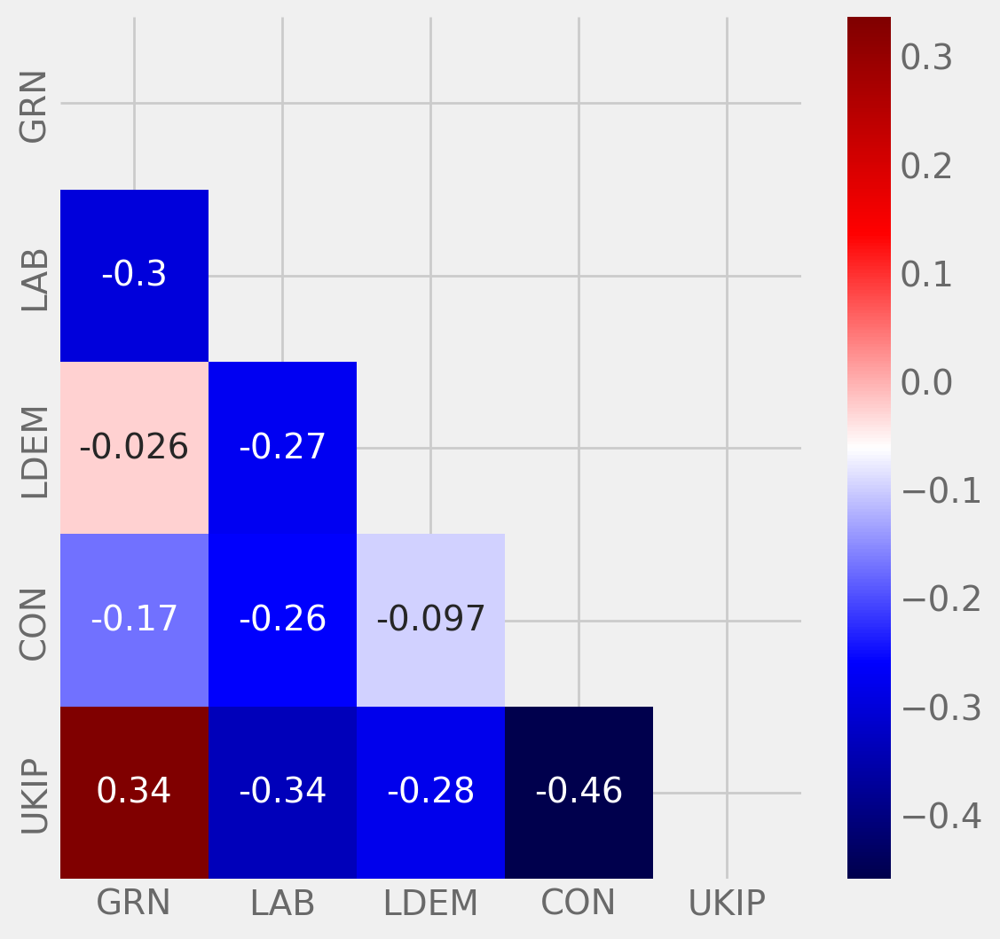

In [22]:
corr = df[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(6, 6))
sns.heatmap(corr, annot=True, cmap='seismic', mask=mask);

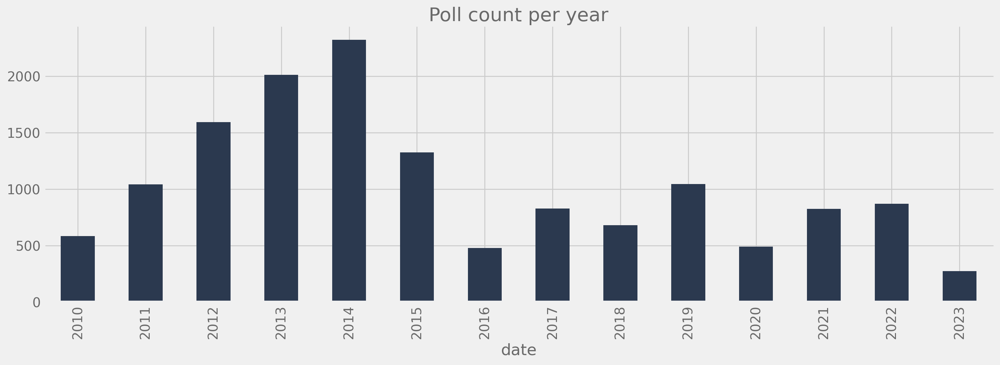

In [23]:
df.groupby(df.index.year)[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].count().sum(axis='columns').plot.bar(figsize=(16, 5), color="#2b394f")
plt.title("Poll count per year");

In [24]:
df_w = df.resample("W").mean()

/tmp/ipykernel_2066999/830431609.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_w = df.resample("W").mean()


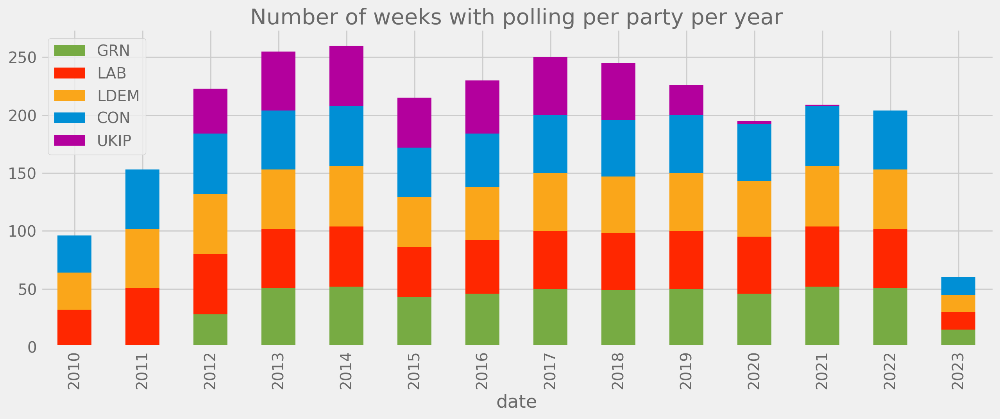

In [25]:
(df_w.groupby(df_w.index.year)[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].count()
 .plot.bar(stacked=True,
           figsize=(14, 5),
           color=["#77AB43", "#FF2700", "#FAA61A", "#008FD5", "#B3009D"]))
plt.title("Number of weeks with polling per party per year");

In [26]:
df_w.groupby(df_w.index.year)[['GRN', 'LAB', 'LDEM', 'CON', 'UKIP']].count()

,GRN,LAB,LDEM,CON,UKIP
date,,,,,
2010,0,32,32,32,0
2011,0,51,51,51,0
2012,28,52,52,52,39
2013,51,51,51,51,51
2014,52,52,52,52,52
2015,43,43,43,43,43
2016,46,46,46,46,46
2017,50,50,50,50,50
2018,49,49,49,49,49


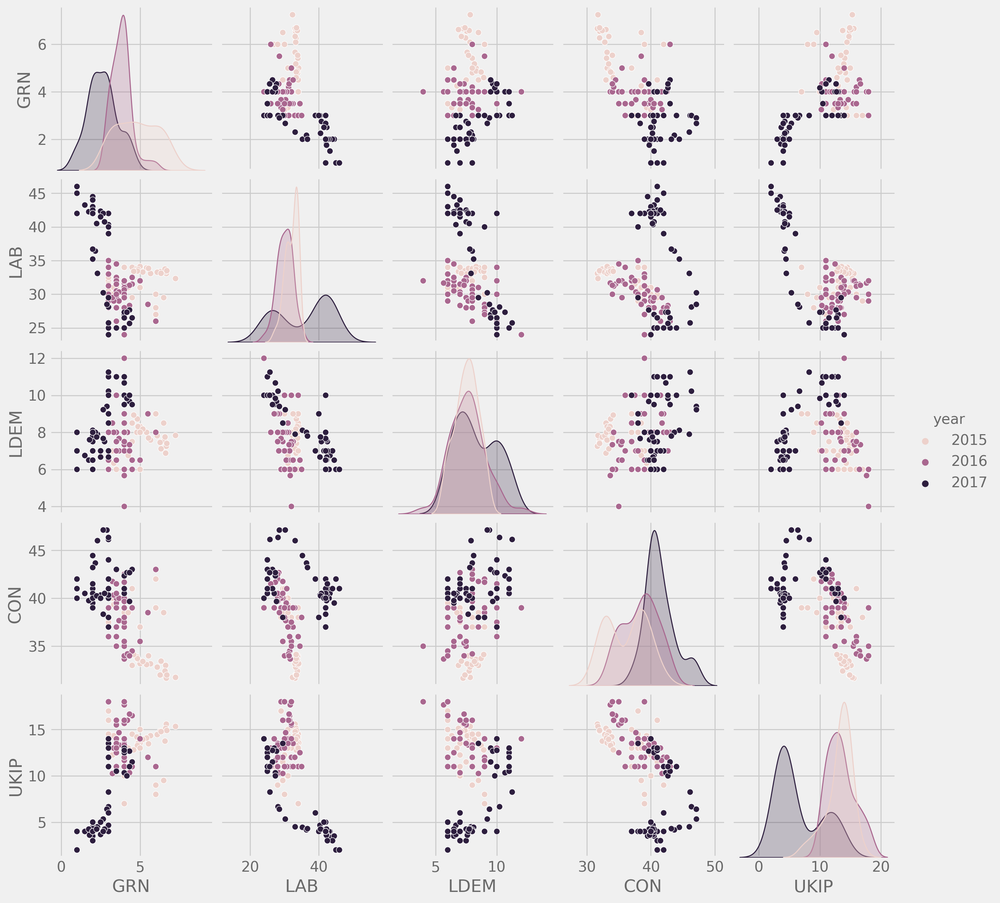

In [27]:
sns.pairplot(df_w.assign(year=df_w.index.year).query('2015 <= year <= 2017'),
             hue='year', vars=['GRN', 'LAB', 'LDEM', 'CON', 'UKIP'],
             diag_kws={"linewidth": 1});

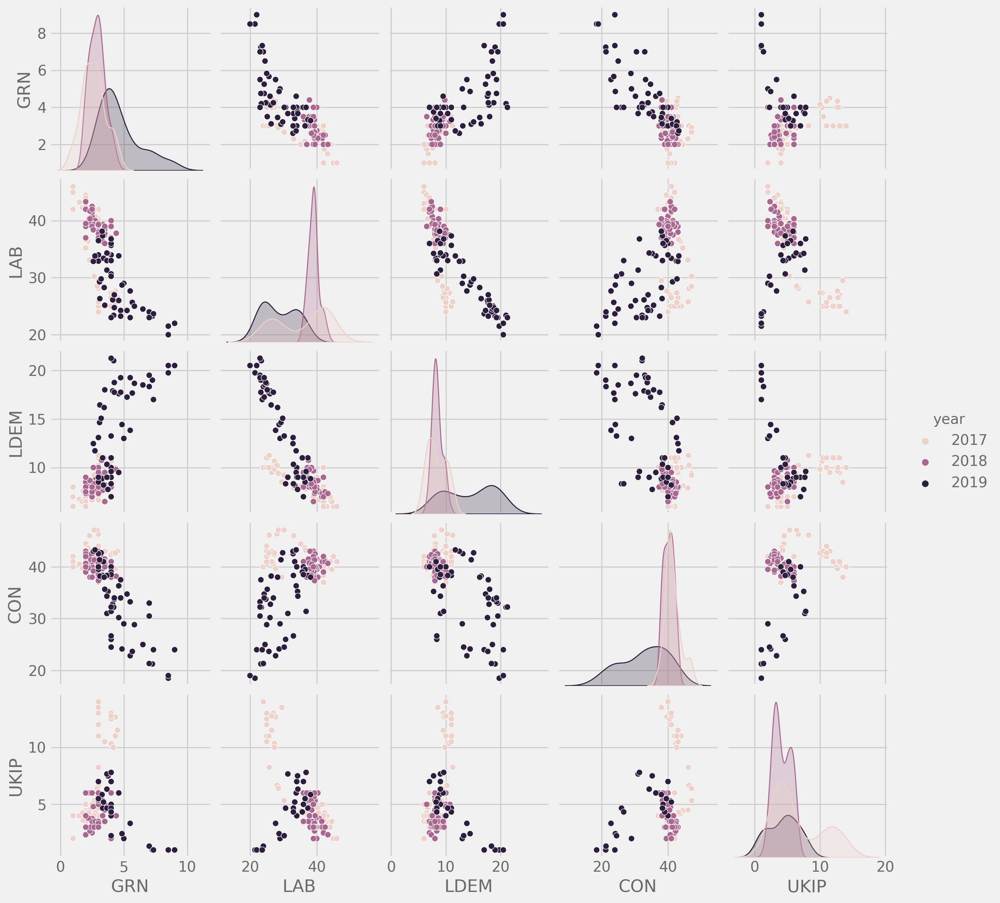

In [28]:
sns.pairplot(df_w.assign(year=df_w.index.year).query('2017 <= year <= 2019'),
             hue='year', vars=['GRN', 'LAB', 'LDEM', 'CON', 'UKIP'],
             diag_kws={"linewidth": 1});

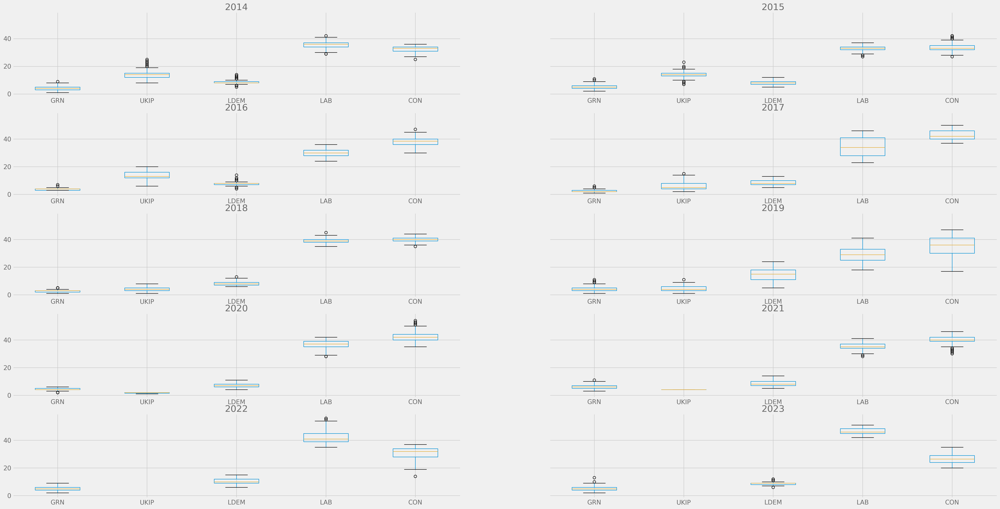

In [29]:
tmp = df[df.index.year >= 2014][["GRN", "UKIP", "LDEM", "LAB", "CON"]]
tmp.groupby(tmp.index.year).boxplot(figsize=(38, 20), layout=(5, 2));

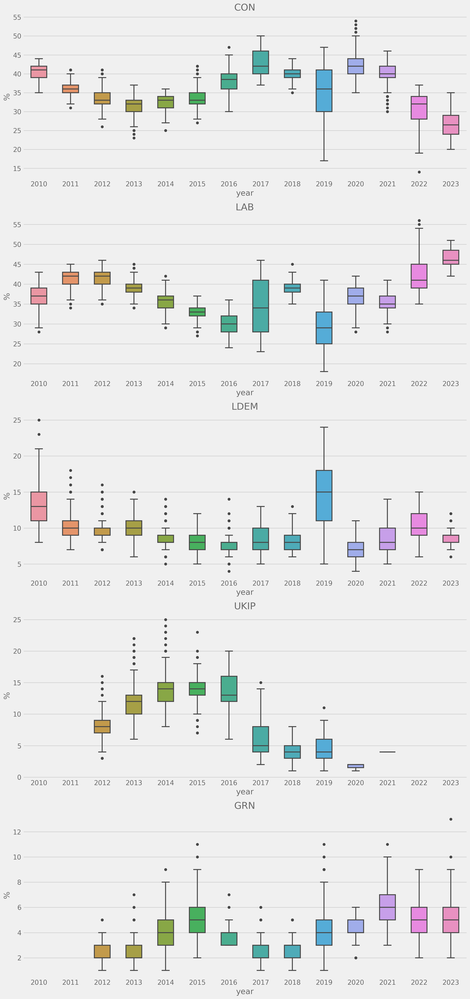

In [30]:
boxprops = {"linewidth": 2}
medianprops = {"linewidth": 2}
whiskerprops = {"linewidth": 2}
capprops = {"linewidth": 2}
flierprops = {"marker": "o"}
fig, axes = plt.subplots(5, 1, figsize=(15, 35))
for party, ax in zip(['CON', 'LAB', 'LDEM', 'UKIP', 'GRN'], axes):
    sns.boxplot(data=df.assign(year=df.index.year), x='year', y=party, width=0.5, ax=ax,
                boxprops=boxprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=flierprops)
    ax.set_title(party)
    ax.set_ylabel("%")

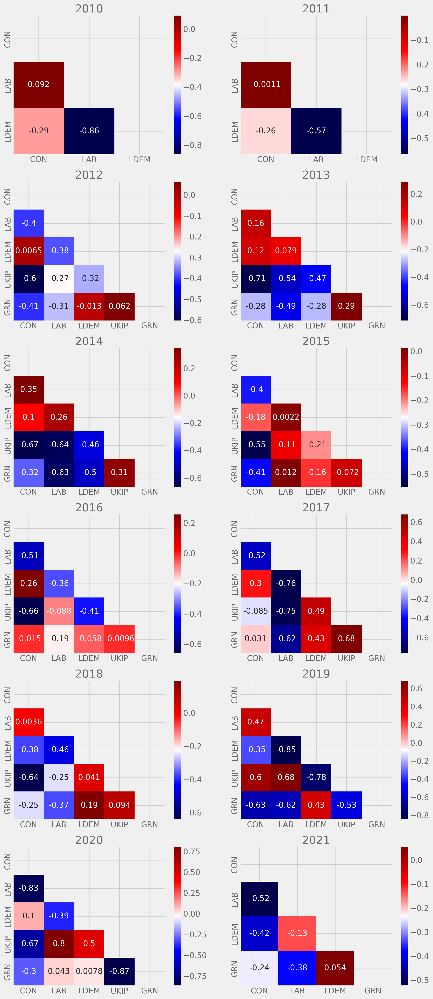

In [31]:
correlations = df.groupby(df.index.year)[['CON', 'LAB', 'LDEM', 'UKIP', 'GRN']].corr().transpose()
fig, axes = plt.subplots(6, 2, figsize=(12, 30))
for year, (i, j) in zip(df.index.year.unique(), product(range(6), range(2))):
    corr = (correlations[year]
            .dropna(how="all", axis="rows")
            .dropna(how="all", axis="columns"))
    mask = np.zeros_like(corr, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(corr,
                annot=True,
                ax=axes[i][j],
                mask=mask,
                cmap='seismic')
    axes[i][j].set_title(year)

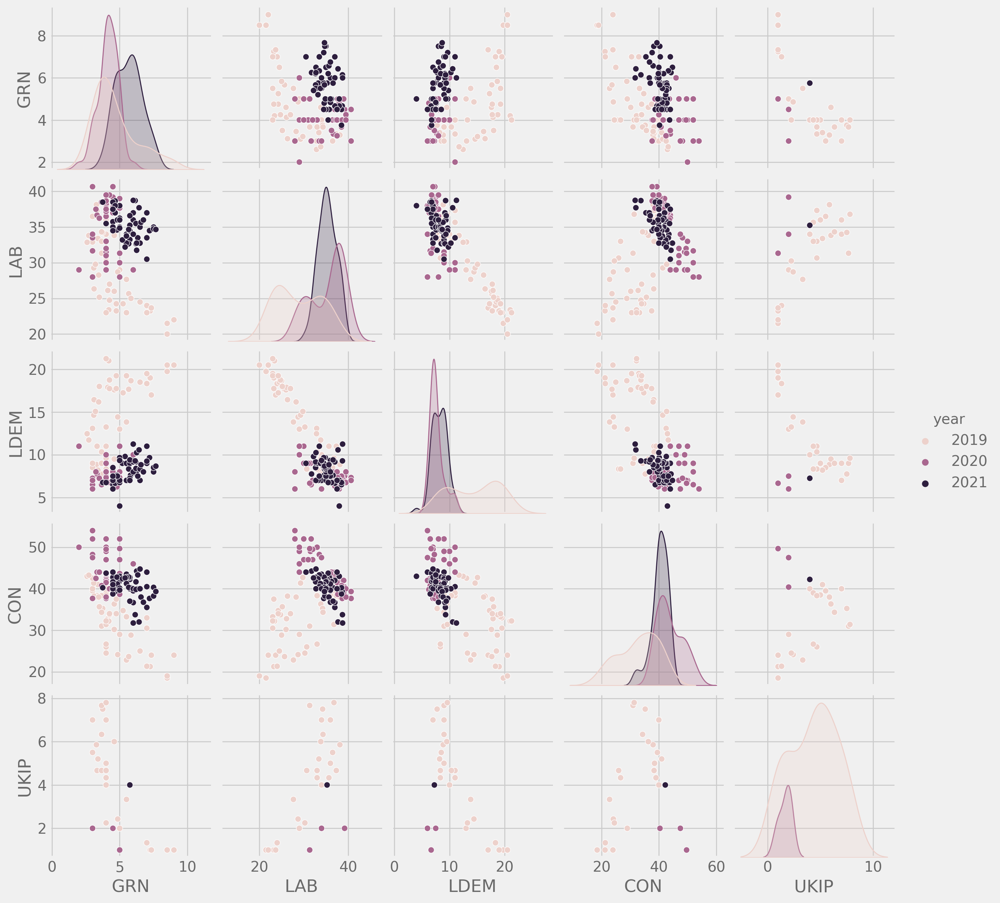

In [32]:
sns.pairplot(df_w.assign(year=df_w.index.year).query('2019 <= year <= 2021'),
             hue='year', vars=['GRN', 'LAB', 'LDEM', 'CON', 'UKIP'],
             diag_kws={"linewidth": 1});

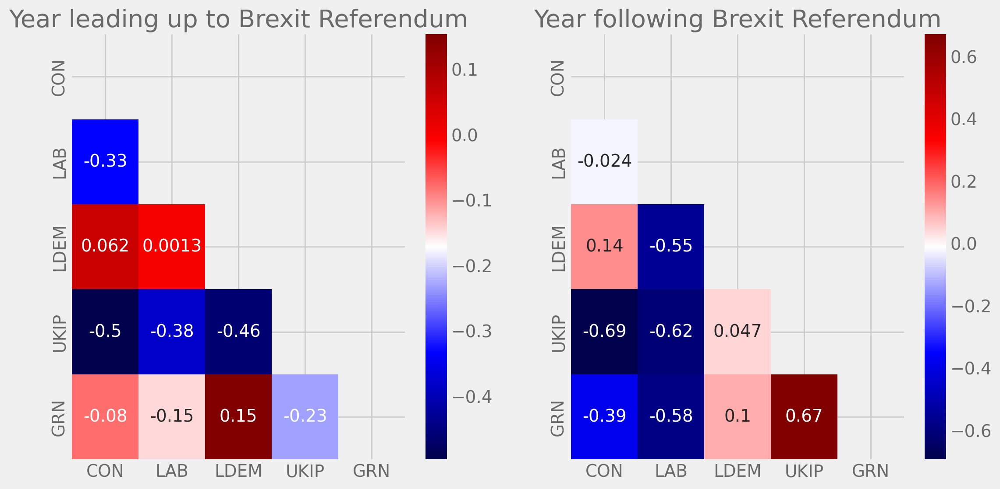

In [33]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
corr = df[(df.index >= pd.to_datetime("23 June 2015")) & (df.index <= pd.to_datetime("23 June 2016"))][['CON', 'LAB', 'LDEM', 'UKIP', 'GRN']].corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr,
            annot=True,
            ax=ax1,
            mask=mask,
            cmap='seismic')
ax1.set_title("Year leading up to Brexit Referendum")
corr = df[(df.index >= pd.to_datetime("23 June 2016")) & (df.index <= pd.to_datetime("23 June 2017"))][['CON', 'LAB', 'LDEM', 'UKIP', 'GRN']].corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr,
            annot=True,
            ax=ax2,
            mask=mask,
            cmap='seismic')
ax2.set_title("Year following Brexit Referendum");